# Churn Analysis

Let's import the required libraries. We'll start by importing `pandas` to handle the Data and `numpy` to perform some numerical calculations.

In [1]:
import numpy as np
import pandas as pd

Now, we'll import the libraries for making plots.

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
%matplotlib inline

---

## About the Data

The [dataset](https://www.kaggle.com/adammaus/predicting-churn-for-bank-customers) used for this project was obtained from Kaggle. It contains data about customers who are withdrawing their account from a bank.

Let's first load the data and understand its content.

### Load the data

In [29]:
df = pd.read_csv('Churn.csv')


## Exploratory Data Analysis
### Review the data

In [14]:
df.columns

Index(['RowNumber', 'CustomerId', 'Surname', 'CreditScore', 'Geography',
       'Gender', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Exited'],
      dtype='object')

In [10]:
print(f"The dataset contains {df.shape[0]} observations, from which we have {df.shape[1]} attributes")

The dataset contains 10000 observations, from which we have 14 attributes


In [11]:
print(f"Among their attributes, we observe {df.columns.tolist()}")

Among their attributes, we observe ['RowNumber', 'CustomerId', 'Surname', 'CreditScore', 'Geography', 'Gender', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary', 'Exited']


In [16]:
df.nunique(axis=0)

RowNumber          10000
CustomerId         10000
Surname             2932
CreditScore          460
Geography              3
Gender                 2
Age                   70
Tenure                11
Balance             6382
NumOfProducts          4
HasCrCard              2
IsActiveMember         2
EstimatedSalary     9999
Exited                 2
dtype: int64

In [15]:

df.describe().apply(lambda s: s.apply(lambda x: format(x, 'f')))

,RowNumber,CustomerId,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,5000.500000,15690940.569400,650.528800,38.921800,5.012800,76485.889288,1.530200,0.705500,0.515100,100090.239881,0.203700
std,2886.895680,71936.186123,96.653299,10.487806,2.892174,62397.405202,0.581654,0.455840,0.499797,57510.492818,0.402769
min,1.000000,15565701.000000,350.000000,18.000000,0.000000,0.000000,1.000000,0.000000,0.000000,11.580000,0.000000
25%,2500.750000,15628528.250000,584.000000,32.000000,3.000000,0.000000,1.000000,0.000000,0.000000,51002.110000,0.000000
50%,5000.500000,15690738.000000,652.000000,37.000000,5.000000,97198.540000,1.000000,1.000000,1.000000,100193.915000,0.000000
75%,7500.250000,15753233.750000,718.000000,44.000000,7.000000,127644.240000,2.000000,1.000000,1.000000,149388.247500,0.000000
max,10000.000000,15815690.000000,850.000000,92.000000,10.000000,250898.090000,4.000000,1.000000,1.000000,199992.480000,1.000000


In [ ]:
Let's check if we have any missing values.

In [12]:
print("Column          Missing values")
print("----------------------------123--")
df.isnull().sum()

Column          Missing values
----------------------------123--


RowNumber          0
CustomerId         0
Surname            0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

And which type of data we have in each column.

In [13]:
print("Column               types")
print("--------------------------")
df.dtypes

Column               types
--------------------------


RowNumber            int64
CustomerId           int64
Surname             object
CreditScore          int64
Geography           object
Gender              object
Age                  int64
Tenure               int64
Balance            float64
NumOfProducts        int64
HasCrCard            int64
IsActiveMember       int64
EstimatedSalary    float64
Exited               int64
dtype: object

We can see that the dataset contains both categorical and continuous variables.

How many unique values do we have for each attribute?

In [14]:
print("Column         Unique Values")
print("----------------------------")
df.nunique()

Column         Unique Values
----------------------------


RowNumber          10000
CustomerId         10000
Surname             2932
CreditScore          460
Geography              3
Gender                 2
Age                   70
Tenure                11
Balance             6382
NumOfProducts          4
HasCrCard              2
IsActiveMember         2
EstimatedSalary     9999
Exited                 2
dtype: int64

In [15]:
print(f"Our target variable is Exited. We can observe that it has only two possible variables: {df['Exited'].unique().tolist()}")

Our target variable is Exited. We can observe that it has only two possible variables: [1, 0]


mean=100090.240 stdv=57507.617
[]


### Clean the data
### Outliers

In [35]:
from numpy import mean
from numpy import std
# calculate summary statistics
data_mean, data_std = mean(df.EstimatedSalary), std(df.EstimatedSalary)
print('mean=%.3f stdv=%.3f' % (mean(df.EstimatedSalary), std(df.EstimatedSalary)))
# identify outliers
cut_off = data_std * 3
lower, upper = data_mean - cut_off, data_mean + cut_off
print('lower=%.3f upper=%.3f' % (lower, upper))
# identify outliers
outliers = [x for x in df.EstimatedSalary if x < lower or x > upper]
print(outliers)

mean=100110.240 stdv=57542.819
lower=-72518.216 upper=272738.696
[301348.88]


In [ ]:
#df_cleaned = df_cleaned[df_cleaned['EstimatedSalary'].between(999.99, 99999.00)]
#df_cleaned = df_cleaned[df_cleaned['EstimatedSalary'].<272738.696]

In [43]:
df.drop(['RowNumber', 'CustomerId', 'Surname'], axis=1, inplace=True)

We also can rename ethe columns to avoid having Capital letters.

In [46]:
new_names = {
    'CreditScore': 'credit_score',
    'Geography': 'country',
    'Gender': 'gender',
    'Age': 'age',
    'Tenure': 'tenure',
    'Balance': 'balance',
    'NumOfProducts': 'number_products',
    'HasCrCard': 'owns_credit_card',
    'IsActiveMember': 'is_active_member',
    'EstimatedSalary': 'estimated_salary',
    'Exited': 'exited'
}

In [47]:
df.rename(columns=new_names, inplace=True)

In [19]:
df.head()

,credit_score,country,gender,age,tenure,balance,number_products,owns_credit_card,is_active_member,estimated_salary,exited
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


---

Because our target variable is `exited`, we should analyse the data focusing on how the different features are related to this variable. Let's start by getting how many customers have been lost.

In [20]:
amount_retained = df[df['exited'] == 0]['exited'].count() / df.shape[0] * 100
amount_lost = df[df['exited'] == 1]['exited'].count() / df.shape[0] * 100

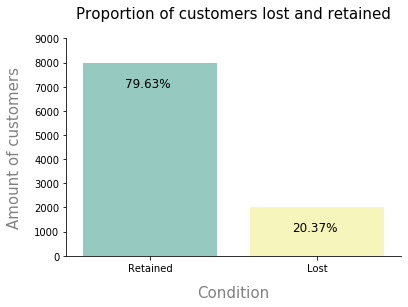

In [21]:
fig, ax = plt.subplots()
sns.countplot(x='exited', palette="Set3", data=df)
plt.xticks([0, 1], ['Retained', 'Lost'])
plt.xlabel('Condition', size=15, labelpad=12, color='grey')
plt.ylabel('Amount of customers', size=15, labelpad=12, color='grey')
plt.title("Proportion of customers lost and retained", size=15, pad=20)
plt.ylim(0, 9000)
plt.text(-0.15, 7000, f"{round(amount_retained, 2)}%", fontsize=12)
plt.text(0.85, 1000, f"{round(amount_lost, 2)}%", fontsize=12)
sns.despine()
plt.show()

We can observe that **20.37%** of the customers have churned. 

This information is valuable because for classification models we need to confirm that our dataset does not suffer from data imbalance, which usually reflects an unequal distribution of classes within a dataset. Even though the class is not equally distributed, we can say that it does not suffer from high-class imbalance.

After that, we will analyse the relationship between categorical variables and the target variable.

In [52]:
categorical_labels = [['gender', 'country'], ['owns_credit_card', 'is_active_member']]
colors = [['Set1', 'Set2'], ['Set3', 'PuRd']]

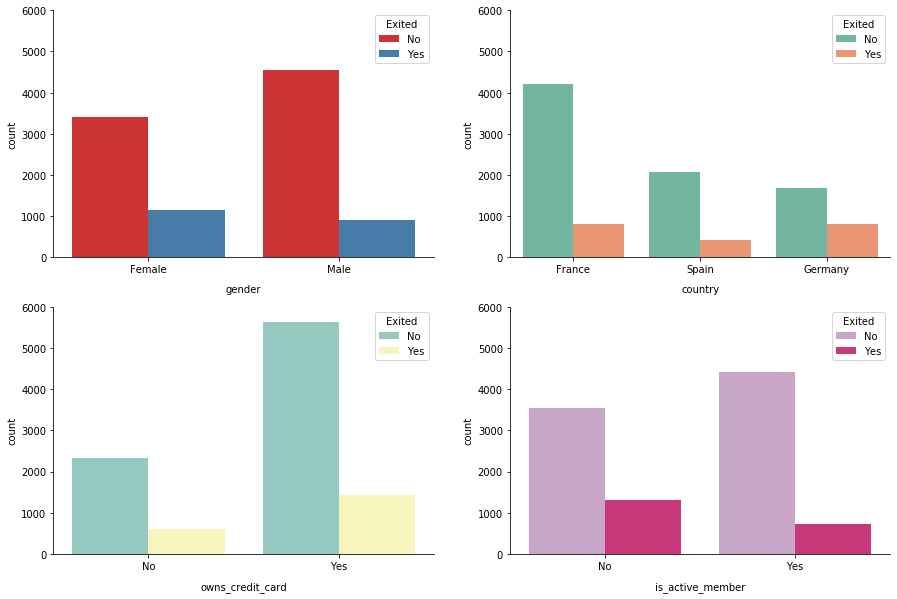

In [53]:
fig, ax = plt.subplots(2, 2, figsize=(15, 10))
for i in range(2):
    for j in range(2):
        feature = categorical_labels[i][j]
        color = colors[i][j]
        ax1 = sns.countplot(x=feature, hue='exited', palette=color, data=df, ax=ax[i][j])
        ax1.set_xlabel(feature, labelpad=10)
        ax1.set_ylim(0, 6000)
        ax1.legend(title='Exited', labels= ['No', 'Yes'])
        if i == 1:
            ax1.set_xticklabels(['No', 'Yes'])
sns.despine()

In [24]:
female_churn = round(df[(df['exited'] == 1) & (df['gender'] == 'Female')]['exited'].count() / df[df['gender'] == 'Female']['exited'].count()*100, 2)
male_churn = round(df[(df['exited'] == 1) & (df['gender'] == 'Male')]['exited'].count() / df[df['gender'] == 'Male']['exited'].count() * 100, 2)

print(f"The percentage of female customers churning is {female_churn}% while the percetage of male customers churning is {male_churn}%")

The percentage of female customers churning is 25.07% while the percetage of male customers churning is 16.46%


In [25]:
active_churn = round(df[(df['exited'] == 1) & (df['is_active_member'] == 1)]['exited'].count() / df[df['is_active_member'] == 1]['exited'].count()*100, 2)
inactive_churn = round(df[(df['exited'] == 1) & (df['is_active_member'] == 0)]['exited'].count() / df[df['is_active_member'] == 0]['exited'].count() * 100, 2)

print(f"The percentage of active members churning is {active_churn}% while the percetage of inactive members churning is {inactive_churn}%")

The percentage of active members churning is 14.27% while the percetage of inactive members churning is 26.85%


In [26]:
credit_churn = round(df[(df['exited'] == 1) & (df['owns_credit_card'] == 1)]['exited'].count() / df[df['owns_credit_card'] == 1]['exited'].count()*100, 2)
no_credit_churn = round(df[(df['exited'] == 1) & (df['owns_credit_card'] == 0)]['exited'].count() / df[df['owns_credit_card'] == 0]['exited'].count() * 100, 2)

print(f"The percentage of custumers with credit card churning is {credit_churn}% while the percetage that do not have credit cards and")
print(f"churn is {no_credit_churn}%")

The percentage of custumers with credit card churning is 20.18% while the percetage that do not have credit cards and
churn is 20.81%


From the plots and the calculations, we learn several things:

- The proportion of female customers that churn is greater than the proportion of male customers. 

- Most of the customers come from France. Nevertheless, Germany and Spain have a greater proportion of customers churning.

- The proportion of inactive members that churn is higher than the proportion of active members.

Now, we will focus on the relationship between continuous variables and the target variable.

In [54]:
numerical_labels = [['age', 'credit_score'], 
                    ['tenure', 'balance'],
                   ['number_products', 'estimated_salary']]
num_colors = [['Set1', 'Set2'], 
              ['Set3', 'PuRd'],
              ['Spectral', 'Wistia']]

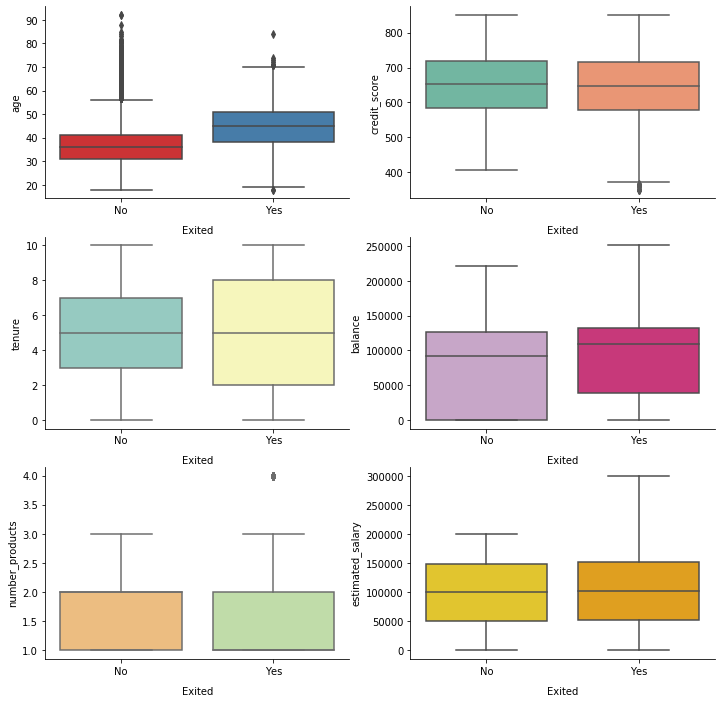

In [55]:
fig, ax = plt.subplots(3, 2, figsize=(12, 12))
for i in range(3):
    for j in range(2):
        feature = numerical_labels[i][j]
        color = num_colors[i][j]
        ax1 = sns.boxplot(x='exited', y=feature, palette=color, data=df, ax=ax[i][j])
        ax1.set_xlabel('Exited', labelpad=10)
        ax1.set_xticklabels(['No', 'Yes'])
sns.despine()

In [29]:
# Check median age for churning and no churning customers
pd.DataFrame(df.groupby('exited')['age'].describe())

,count,mean,std,min,25%,50%,75%,max
exited,,,,,,,,
0,7963.0,37.408389,10.125363,18.0,31.0,36.0,41.0,92.0
1,2037.0,44.837997,9.761562,18.0,38.0,45.0,51.0,84.0


In [30]:
# Check median age for churning and no churning customers
pd.DataFrame(df.groupby('exited')['balance'].describe())

,count,mean,std,min,25%,50%,75%,max
exited,,,,,,,,
0,7963.0,72745.296779,62848.040701,0.0,0.00,92072.68,126410.28,221532.80
1,2037.0,91108.539337,58360.794816,0.0,38340.02,109349.29,131433.33,250898.09


Findings:

- Customers that churn are older than those who are retained.

- There is no difference in the median credit score or tenure between lost and retained customers.

- Among the customers that churn, most of them seem to still have a significant balance in their bank account.

- Neither estimated salary nor the number of products seems to have an effect on customer churn.

Last, we can examine the correlation between the different continuos variables to discover if there is any codependency between them.

# Correlation matrix


In [49]:
df.head()

,credit_score,country,gender,age,tenure,balance,number_products,owns_credit_card,is_active_member,estimated_salary,exited
0,619,France,Female,42,2,0.00,1,1,1,301348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


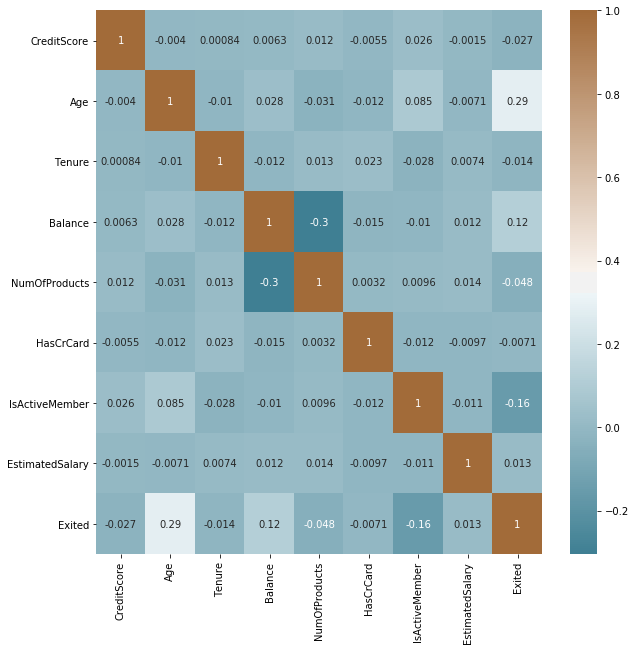

In [44]:

corr = df.corr()# plot the heatmap
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, annot=True, cmap=sns.diverging_palette(220, 40, as_cmap=True))

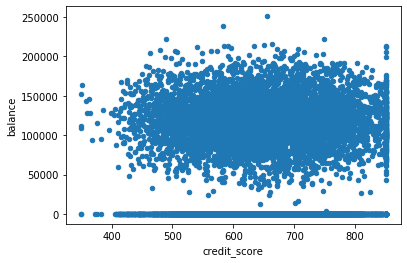

In [64]:
df.plot(kind='scatter', x='credit_score', y='balance')

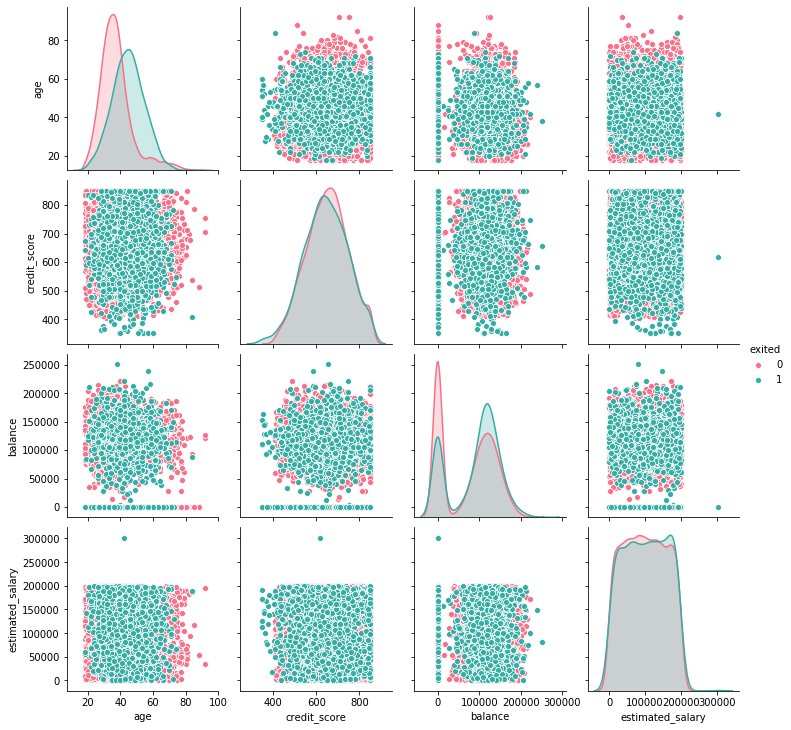

In [57]:
# fig, ax = plt.subplots(3, 2, figsize=(12, 12))
sns.pairplot(df, vars=['age', 'credit_score', 'balance', 'estimated_salary'], 
             hue="exited", palette='husl')
sns.despine()

No relationship can be inferred between continuous variables from the plots.

# Histogram

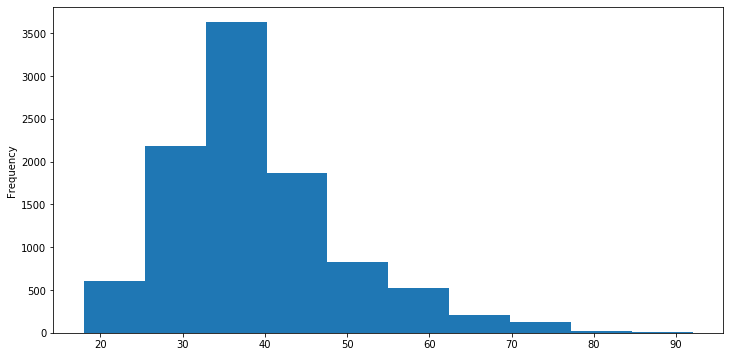

In [66]:
df['ge'].plot(kind='hist', bins=10, figsize=(12,6))
